# Лабораторная работа №7
## Задание
Найти шаблон на изображении

## Решение

In [ ]:
import sys
sys.path.append('../')
import cv2
import numpy as np
import matplotlib.pyplot as plt
from sklearn.cluster import MeanShift, estimate_bandwidth
from google.colab import drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
WIDTH_SIZE = 15
HEIGHT_SIZE = 10
plt.rcParams["figure.figsize"] = [WIDTH_SIZE, HEIGHT_SIZE]

Исходное изображение

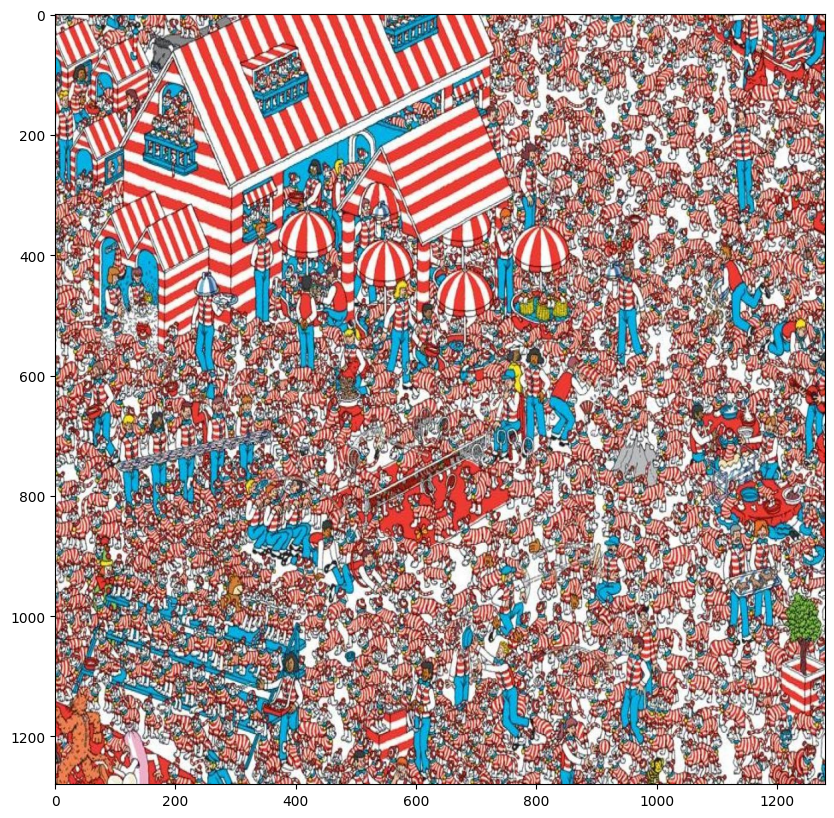

In [ ]:
image_path = '/content/drive/MyDrive/Colab Notebooks/ЦОИ отчеты/lab7.jpg'
img = cv2.imread(image_path)

img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
plt.imshow(img_rgb)
gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

Шаблон

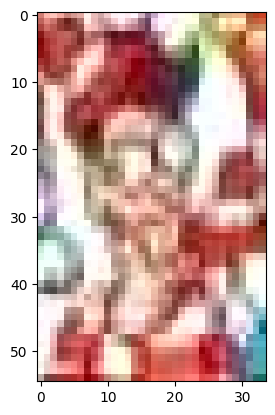

In [ ]:
template_path = '/content/drive/MyDrive/Colab Notebooks/ЦОИ отчеты/lab7_template.jpg'
tmpl = cv2.imread(template_path)

tmpl_rgb = cv2.cvtColor(tmpl, cv2.COLOR_BGR2RGB)
plt.imshow(tmpl_rgb)
gray_tmpl = cv2.cvtColor(tmpl, cv2.COLOR_BGR2GRAY)

## Поиск по сопоставлению шаблона

Размеры шаблона 55 34


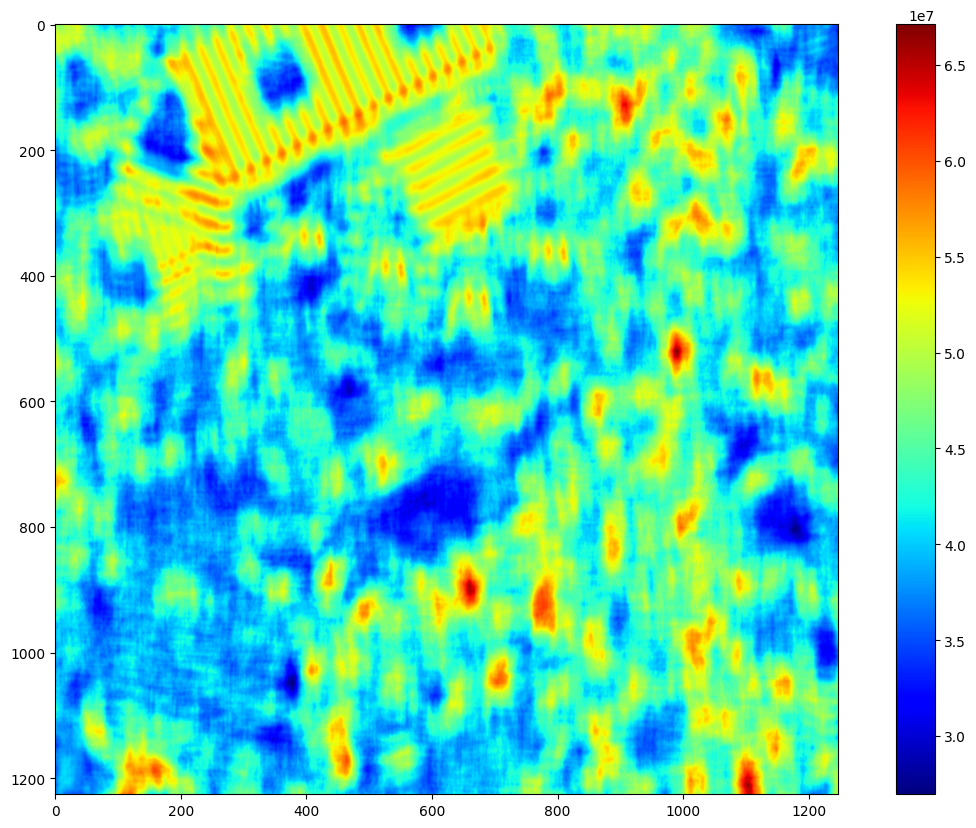

In [ ]:
w, h = tmpl.shape[:-1]

# Вызываем функцию cv2.matchTemplate для вычисления метрики схожести
# в качестве параметров передаем изображение, шаблон и тип вычисляемой метрики
res = cv2.matchTemplate(gray_img,gray_tmpl,cv2.TM_CCORR)
print("Размеры шаблона", w, h)
# Заметную разницу на графике дают следующие метрики:
##    cv2.TM_SQDIFF_NORMED — сумма квадрат разниц цветов, отнормированная в диапазон 0..1.
###    cv2.TM_CCORR — сумма поэлементных произведений шаблона и сегмента картинки
plt.figure()
plt.imshow(res, cmap='jet')
plt.colorbar()

Попытка найти шаблон по порогу схожести

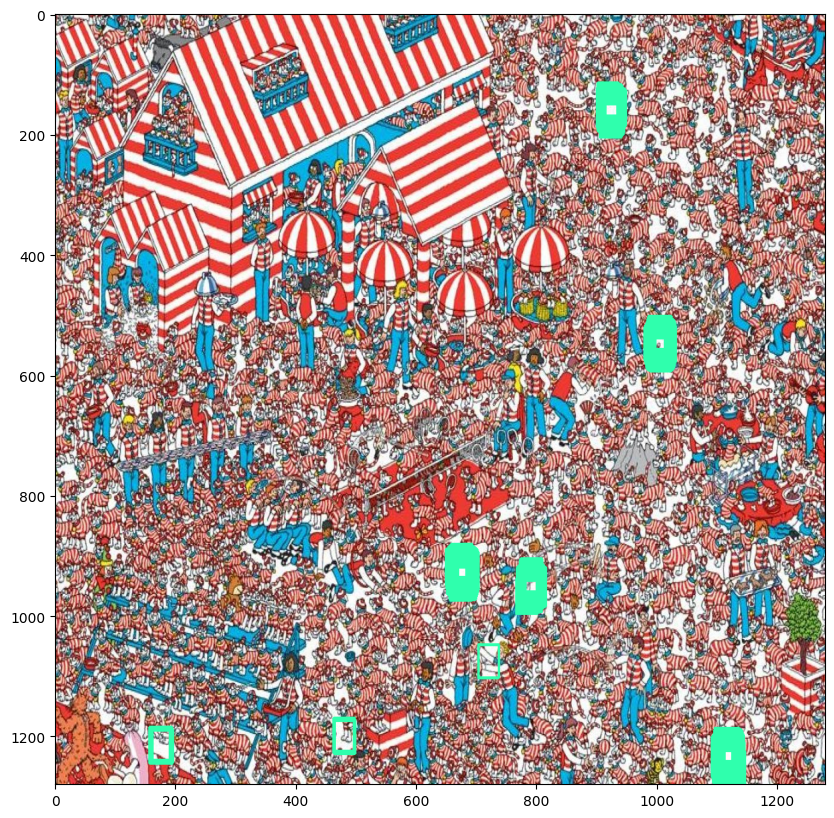

In [ ]:
threshold = 60000000
loc = np.where(res >= threshold)
# Вокруг выделенных максимумов обводим прямоугольники с размерами шаблона
plot_img = img.copy()
for pt in zip(*loc[::-1]):
    cv2.rectangle(plot_img, pt,(pt[0] + h, pt[1] + w),(173,255,47), 2)

# Отображаем результат на графике
plt.figure()
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))

Что-то нашлось, но не целевой объект

## Поиск с использованием оператора Собеля

(Text(0.5, 1.0, 'Original'), ([], []), ([], []))

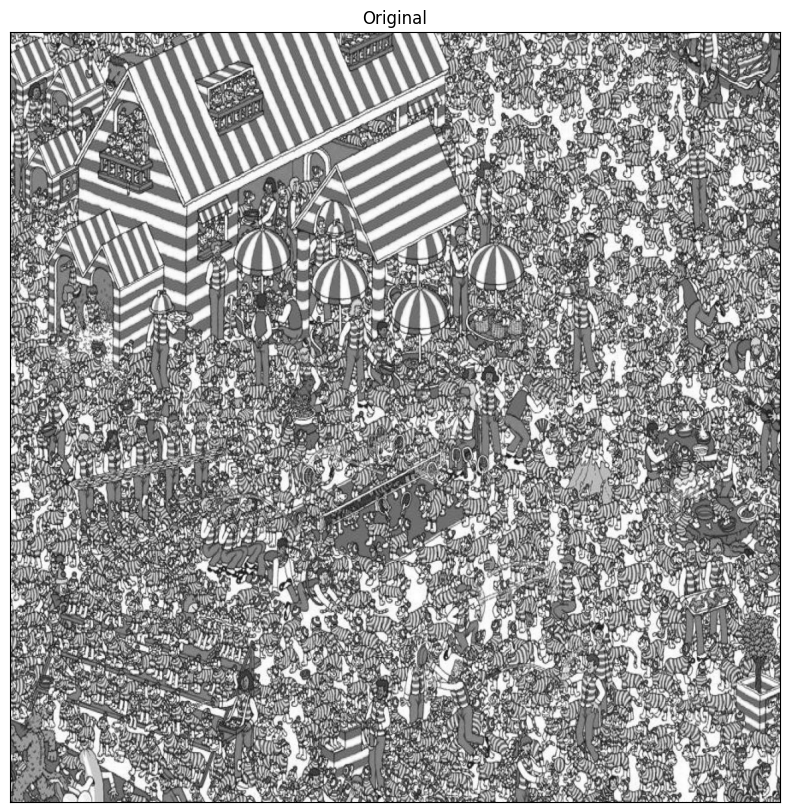

In [ ]:
x = cv2.Sobel(gray_img,cv2.CV_16S,1,0)
y = cv2.Sobel(gray_img,cv2.CV_16S,0,1)

# берем модуль от результата применения фильтра Собеля
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)

# объединяем "вертикальные" и "горизонтальные" границы в одно изображение
dstI = cv2.addWeighted(absX,0.5,absY,0.5,0)
plt.imshow(gray_img,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

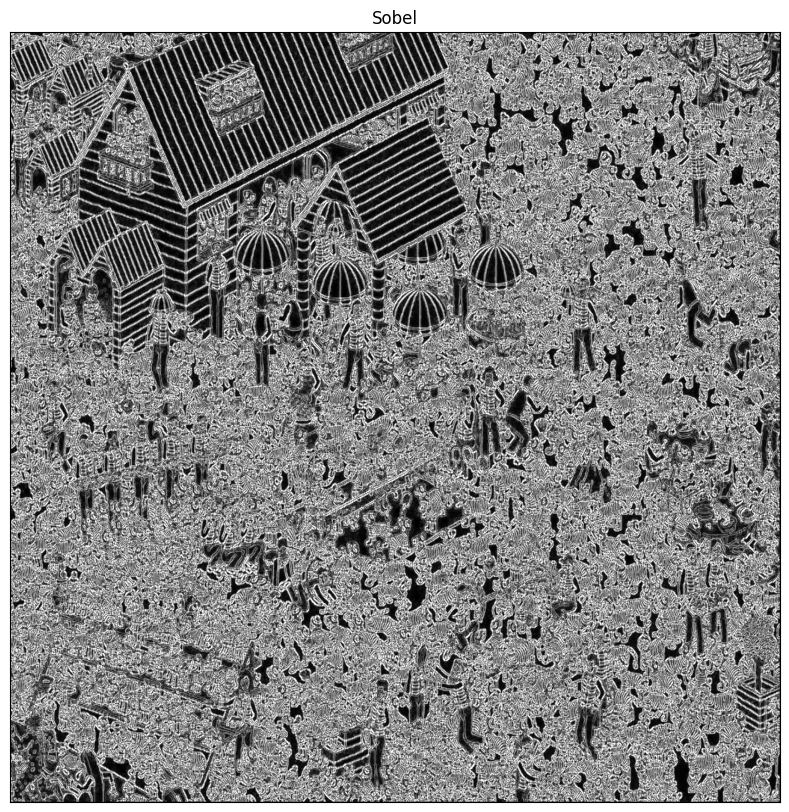

In [ ]:
plt.imshow(dstI,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

(Text(0.5, 1.0, 'Sobel'), ([], []), ([], []))

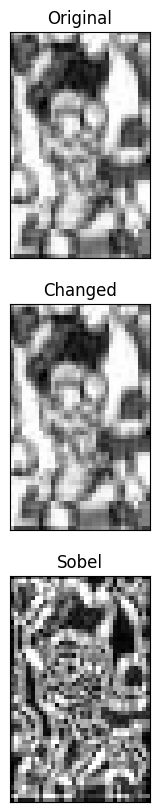

In [ ]:
tmpG = gray_tmpl
x = cv2.Sobel(tmpG,cv2.CV_16S,1,0)
y = cv2.Sobel(tmpG,cv2.CV_16S,0,1)
absX = cv2.convertScaleAbs(x)
absY = cv2.convertScaleAbs(y)
dstT = cv2.addWeighted(absX,0.5,absY,0.5,0)

plt.subplot(3,1,1),plt.imshow(gray_tmpl,cmap = 'gray')
plt.title('Original'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,2),plt.imshow(tmpG,cmap = 'gray')
plt.title('Changed'), plt.xticks([]), plt.yticks([])
plt.subplot(3,1,3),plt.imshow(dstT,cmap = 'gray')
plt.title('Sobel'), plt.xticks([]), plt.yticks([])

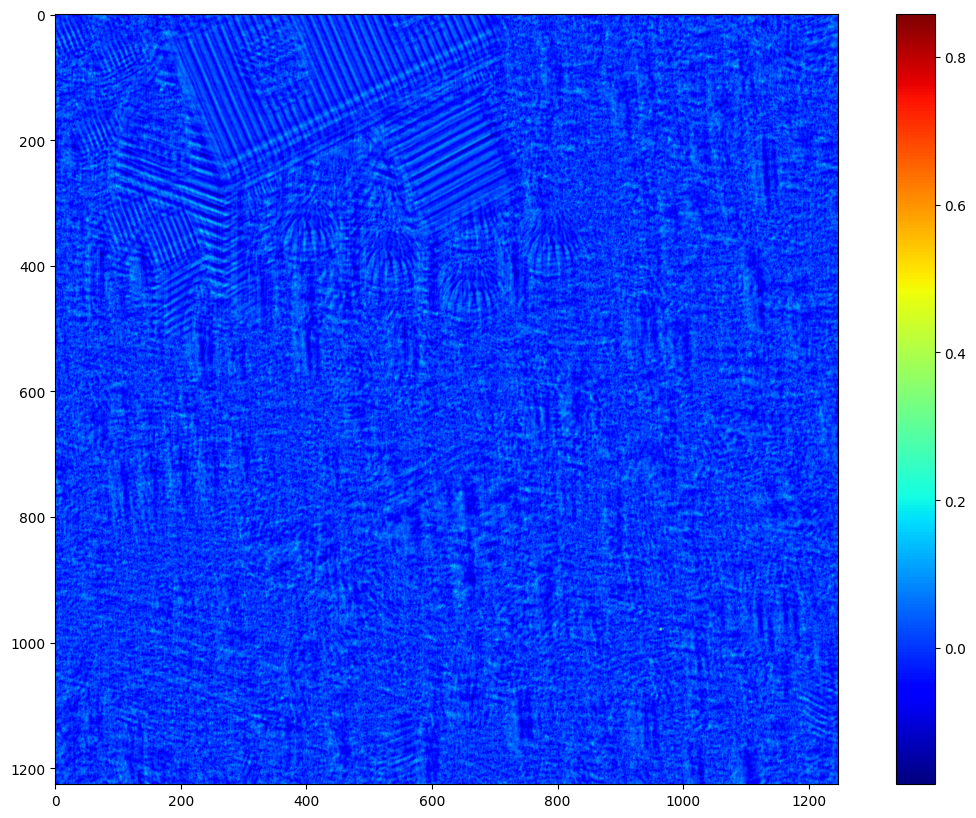

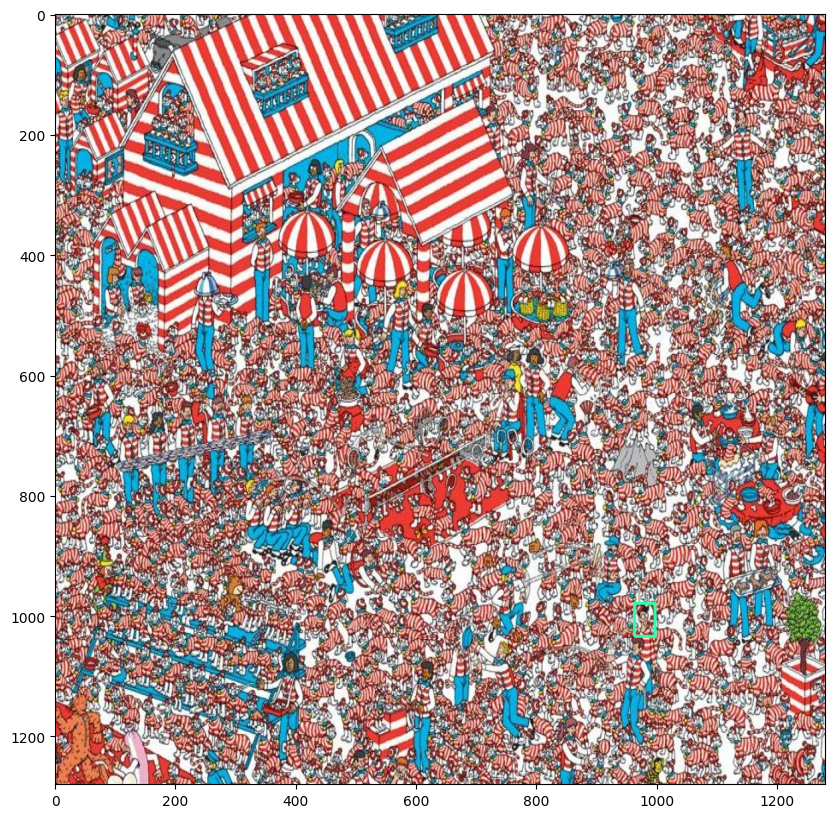

In [ ]:
w, h = tmpG.shape

# Вычисляем метрику схожести
res = cv2.matchTemplate(dstI,dstT,cv2.TM_CCOEFF_NORMED)
plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(res, cmap='jet')
plt.colorbar()

#  Отбираем максимумы и строим результат на графике
threshold = 0.7
loc = np.where(res >= threshold)
plot_img = img.copy()
for pt in zip(*loc[::-1]):
    cv2.rectangle(plot_img, pt,(pt[0] + h, pt[1] + w),(173,255,47), 4)

plt.figure(figsize=(WIDTH_SIZE,HEIGHT_SIZE))
plt.imshow(cv2.cvtColor(plot_img, cv2.COLOR_BGR2RGB))

Невероятно, но шаблон найден

## SIFT

(2.2946438789367676, 1237.015380859375)
2.2646961212158203
348.8468933105469
0.026256125420331955
2.2646961212158203


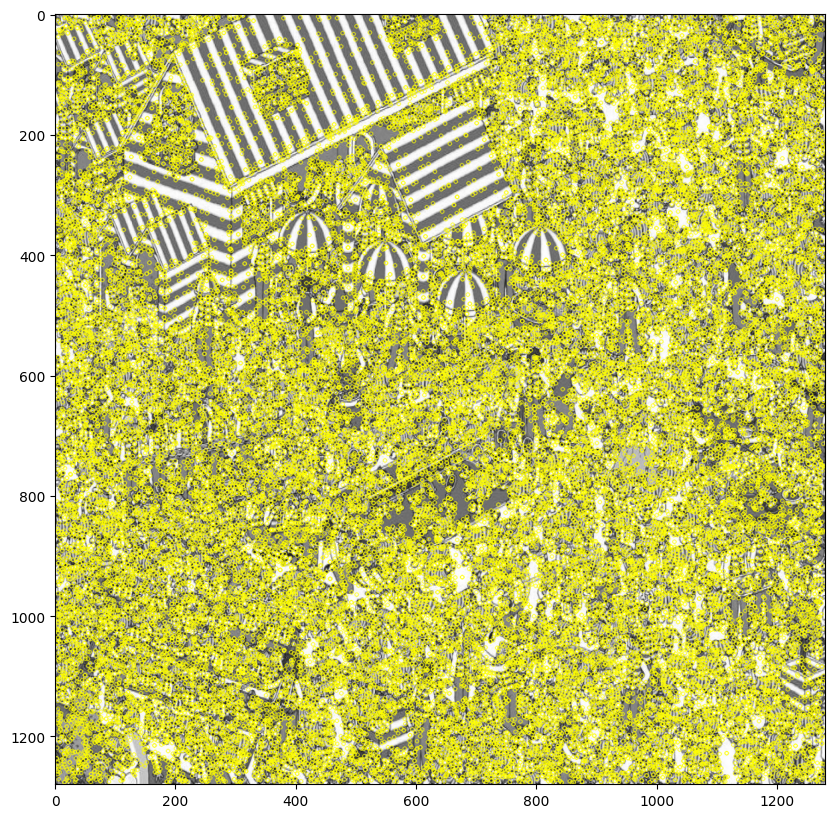

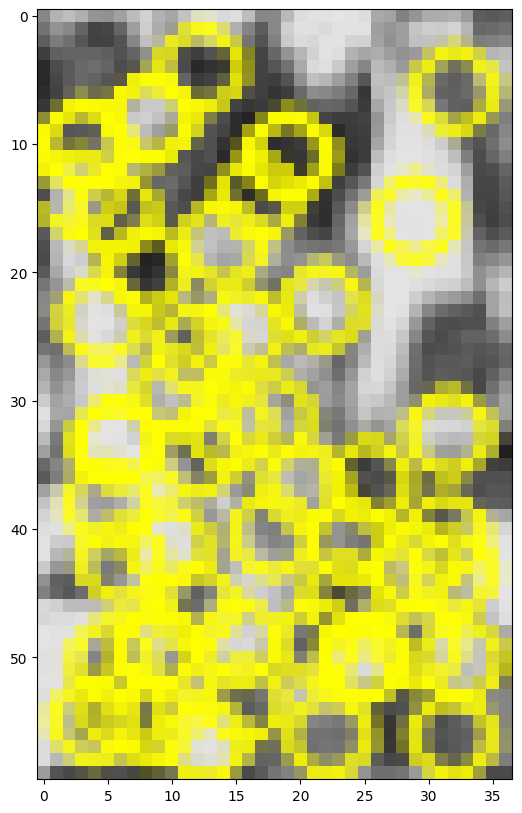

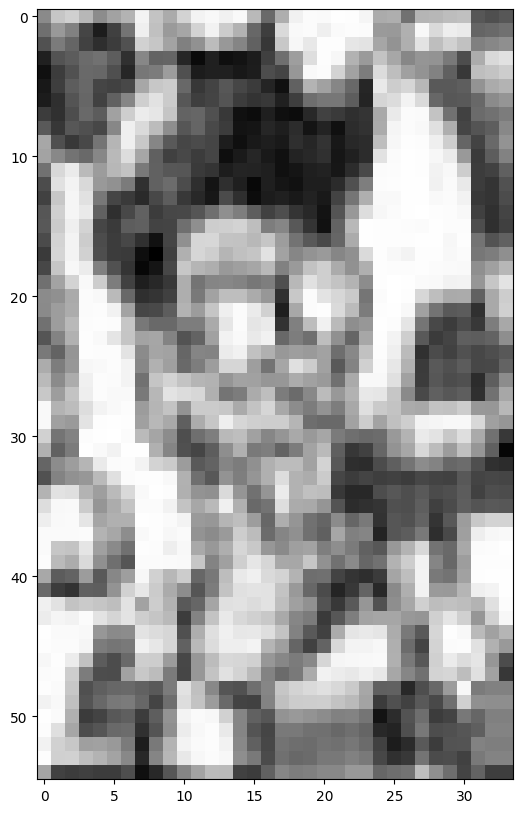

In [ ]:
# Преобразуем и вносим небольшие изменения в шаблон

    # Преобразуем в оттенки серого
scale = 1.1 # масштаб изменения размеров
scBr = 0.9 # коэффициент изменения яркости

template_scale = cv2.resize(np.uint8(0.9*gray_tmpl),
           (int(gray_tmpl.shape[1]*scale), int(gray_tmpl.shape[0]*scale)), interpolation = cv2.INTER_AREA)

# Создаем детектор особых точек
sift = cv2.SIFT_create()
# sift = cv2.xfeatures2d.SIFT_create() # В зависимости от версии opencv может работать эта команда

# Запускаем детектор на изображении и на шаблоне
# Метод возвращает список особых точек и их дескрипторов
k_1, des_1 = sift.detectAndCompute(gray_img, None)
k_2, des_2 = sift.detectAndCompute(template_scale, None)

# Каждая особая точка имеет несколько параметров, таких как координаты,
# размер, угол ориентации, мощность отклика и размер области особой точки.
print(k_1[1].pt)
print(k_1[1].size)
print(k_1[1].angle)
print(k_1[1].response)
print(k_1[1].size)

# Отрисуем найденные точки на картинке
image_key_point = cv2.drawKeypoints(gray_img, k_1, des_1, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(image_key_point, cv2.COLOR_BGR2RGB))

# Отрисуем найденные точки на шаблоне
template_key_point = cv2.drawKeypoints(template_scale, k_2, des_2, (0, 255, 255))
plt.figure()
plt.imshow(cv2.cvtColor(template_key_point, cv2.COLOR_BGR2RGB))

plt.figure()
plt.imshow(gray_tmpl, cmap="gray")

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1, crossCheck=True)


matches = bf.match(des_1, des_2)

print(matches[1].queryIdx)
print(matches[1].trainIdx)
print(matches[1].distance)

3739
51
1999.0


2.118698835372925


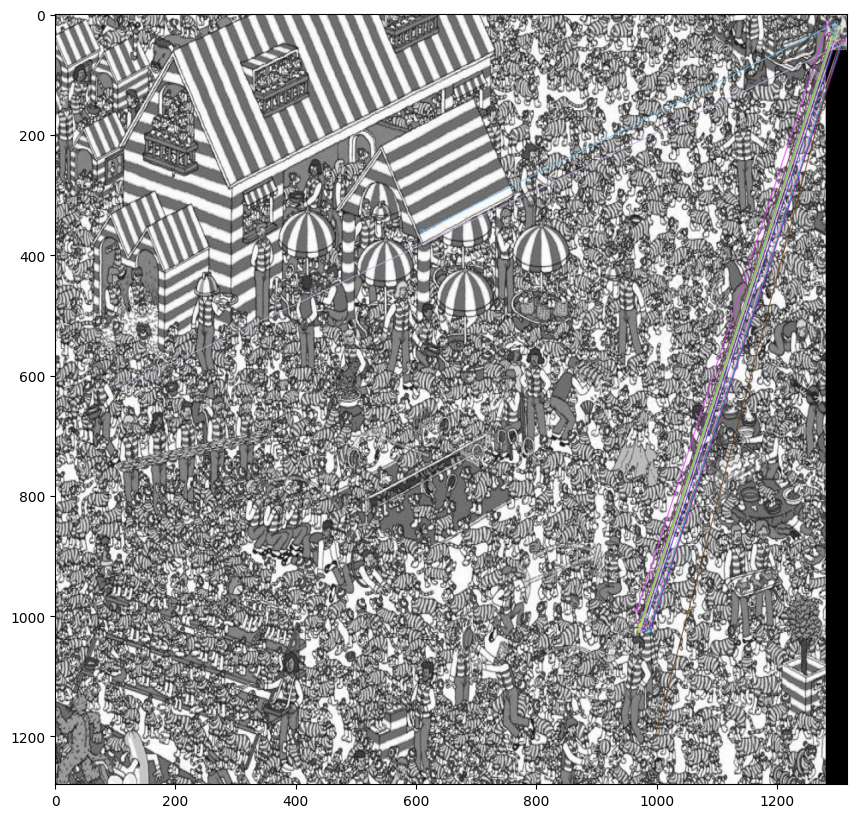

In [ ]:
print(k_1[matches[1].queryIdx].size)
matches = sorted(matches, key=lambda x: x.distance)
image_with_matches = cv2.drawMatches(gray_img, k_1, template_scale, k_2, matches[:20], template_scale, flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_matches, cv2.COLOR_BGR2RGB))

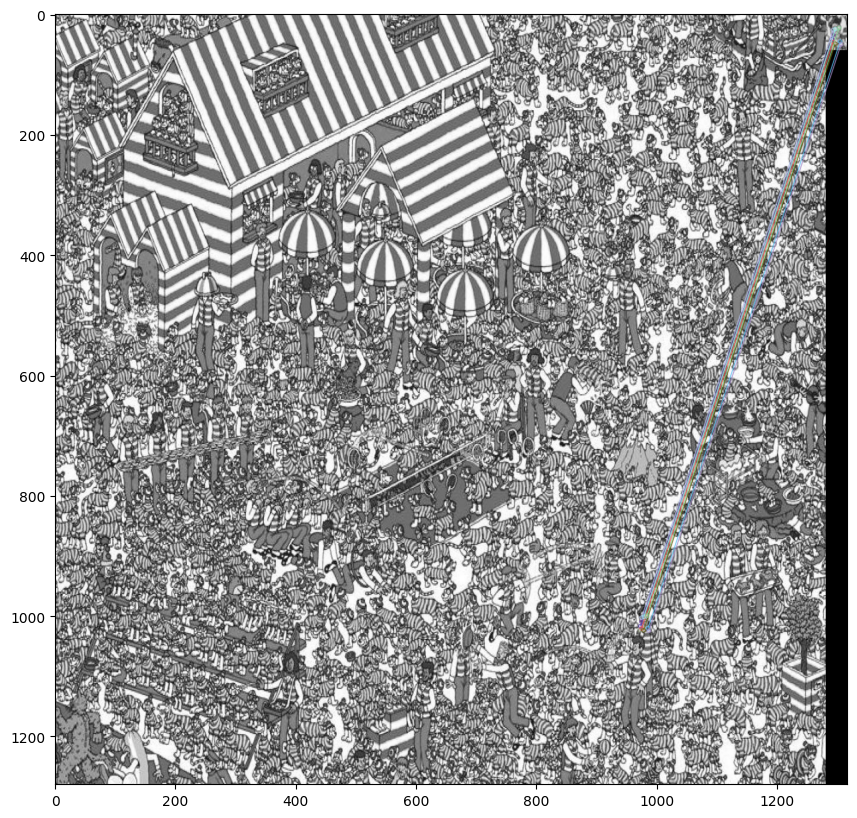

In [ ]:
bf = cv2.BFMatcher(cv2.NORM_L1)
matches = bf.knnMatch(des_1, des_2, k=2)

# Лучшие пары особых точек отбираются с использованием теста отношения правдоподобия
good = []
for m, n in matches:
    if m.distance < 0.4 * n.distance:
        good.append([m])

# построим совпадения на изображении
image_with_knn_matches = cv2.drawMatchesKnn(gray_img,k_1,template_scale,k_2,good[:200],None,flags=2)
plt.figure()
plt.imshow(cv2.cvtColor(image_with_knn_matches, cv2.COLOR_BGR2RGB))

Шаблон найден
